In [38]:
import numpy as np  # Importar la biblioteca NumPy para cálculos numéricos
import matplotlib.pyplot as plt  # Importar la biblioteca Matplotlib para visualización
import keras  # Importar Keras para construir y entrenar redes neuronales
from keras.models import Sequential  # Importar la clase Sequential para modelos de redes neuronales secuenciales
from keras.optimizers import Adam  # Importar el optimizador Adam para ajustar pesos y sesgos
from keras.layers import Convolution2D, MaxPooling2D, Dropout, Flatten, Dense  # Importar capas de Keras para CNNs
import cv2  # Importar la biblioteca OpenCV para procesamiento de imágenes
import pandas as pd  # Importar la biblioteca Pandas para análisis de datos
import random  # Importar el módulo random para generación de números aleatorios
import os  # Importar el módulo os para operaciones relacionadas con el sistema operativo
import ntpath  # Importar el módulo ntpath para manipulación de rutas y nombres de archivo
from sklearn.utils import shuffle  # Importar la función shuffle de scikit-learn para aleatorizar datos
from sklearn.model_selection import train_test_split  # Importar train_test_split para dividir datos en entrenamiento y prueba
import matplotlib.image as mpimg  # Importar la biblioteca Matplotlib para manejar imágenes
from imgaug import augmenters as iaa  # Importar imgaug para realizar aumentación de datos (data augmentation)
import tensorflow as tf #Importar libreria de tensorflow

from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Conv2D, Dense, Flatten
from tensorflow.keras.optimizers import Adam

In [8]:
!git clone <'https://github.com/RigoVegaE/Proyecto_Equipo25_NavegacionAutonoma/tree/main'>

The syntax of the command is incorrect.


El siguiente paso consiste en establecer el nombre de la carpeta donde se guardarán las imágenes de entrenamiento y los registros de conducción, así como los nombres de las columnas para cargar el archivo de registro de conducción. A continuación, leeremos el archivo de registro de conducción utilizando la biblioteca pandas, seleccionando las columnas específicas que nos interesan.

In [10]:
datadir = 'Informacion Simulador/'

columns = ['center', 'left', 'right', 'steering', 'throttle', 'reverse', 'speed']

data = pd.read_csv(os.path.join(datadir, 'driving_log.csv'), names = columns)
pd.set_option('display.max_colwidth', None)

data.head()

,center,left,right,steering,throttle,reverse,speed
0,C:\Users\rescudero\OneDrive - MediaRecoveryInc\Documents\Maestria\Navegacion Autonoma\Proyecto\Informacion Simulador\IMG\center_2023_05_25_19_00_22_270.jpg,C:\Users\rescudero\OneDrive - MediaRecoveryInc\Documents\Maestria\Navegacion Autonoma\Proyecto\Informacion Simulador\IMG\left_2023_05_25_19_00_22_270.jpg,C:\Users\rescudero\OneDrive - MediaRecoveryInc\Documents\Maestria\Navegacion Autonoma\Proyecto\Informacion Simulador\IMG\right_2023_05_25_19_00_22_270.jpg,0.0,0.0,0.0,0.000081
1,C:\Users\rescudero\OneDrive - MediaRecoveryInc\Documents\Maestria\Navegacion Autonoma\Proyecto\Informacion Simulador\IMG\center_2023_05_25_19_00_22_403.jpg,C:\Users\rescudero\OneDrive - MediaRecoveryInc\Documents\Maestria\Navegacion Autonoma\Proyecto\Informacion Simulador\IMG\left_2023_05_25_19_00_22_403.jpg,C:\Users\rescudero\OneDrive - MediaRecoveryInc\Documents\Maestria\Navegacion Autonoma\Proyecto\Informacion Simulador\IMG\right_2023_05_25_19_00_22_403.jpg,0.0,0.0,0.0,0.000081
2,C:\Users\rescudero\OneDrive - MediaRecoveryInc\Documents\Maestria\Navegacion Autonoma\Proyecto\Informacion Simulador\IMG\center_2023_05_25_19_00_22_513.jpg,C:\Users\rescudero\OneDrive - MediaRecoveryInc\Documents\Maestria\Navegacion Autonoma\Proyecto\Informacion Simulador\IMG\left_2023_05_25_19_00_22_513.jpg,C:\Users\rescudero\OneDrive - MediaRecoveryInc\Documents\Maestria\Navegacion Autonoma\Proyecto\Informacion Simulador\IMG\right_2023_05_25_19_00_22_513.jpg,0.0,0.0,0.0,0.000079
3,C:\Users\rescudero\OneDrive - MediaRecoveryInc\Documents\Maestria\Navegacion Autonoma\Proyecto\Informacion Simulador\IMG\center_2023_05_25_19_00_22_630.jpg,C:\Users\rescudero\OneDrive - MediaRecoveryInc\Documents\Maestria\Navegacion Autonoma\Proyecto\Informacion Simulador\IMG\left_2023_05_25_19_00_22_630.jpg,C:\Users\rescudero\OneDrive - MediaRecoveryInc\Documents\Maestria\Navegacion Autonoma\Proyecto\Informacion Simulador\IMG\right_2023_05_25_19_00_22_630.jpg,0.0,0.0,0.0,0.000080
4,C:\Users\rescudero\OneDrive - MediaRecoveryInc\Documents\Maestria\Navegacion Autonoma\Proyecto\Informacion Simulador\IMG\center_2023_05_25_19_00_22_746.jpg,C:\Users\rescudero\OneDrive - MediaRecoveryInc\Documents\Maestria\Navegacion Autonoma\Proyecto\Informacion Simulador\IMG\left_2023_05_25_19_00_22_746.jpg,C:\Users\rescudero\OneDrive - MediaRecoveryInc\Documents\Maestria\Navegacion Autonoma\Proyecto\Informacion Simulador\IMG\right_2023_05_25_19_00_22_746.jpg,0.0,0.0,0.0,0.000081


Este módulo ofrece la funcionalidad de os.path en plataformas Windows. En particular, ntpath.split() nos permite obtener el nombre de archivo y la ruta de la carpeta, eliminando los detalles de ubicación.

In [11]:
def path_leaf(path):
    # : This module provides os.path functionality on Windows platforms.
    # : ntpath.split() gives the file name and folder path
    head, tail = ntpath.split(path)
    return tail

data['center'] = data['center'].apply(path_leaf)
data['left'] = data['left'].apply(path_leaf)
data['right'] = data['right'].apply(path_leaf)
data.head()

,center,left,right,steering,throttle,reverse,speed
0,center_2023_05_25_19_00_22_270.jpg,left_2023_05_25_19_00_22_270.jpg,right_2023_05_25_19_00_22_270.jpg,0.0,0.0,0.0,0.000081
1,center_2023_05_25_19_00_22_403.jpg,left_2023_05_25_19_00_22_403.jpg,right_2023_05_25_19_00_22_403.jpg,0.0,0.0,0.0,0.000081
2,center_2023_05_25_19_00_22_513.jpg,left_2023_05_25_19_00_22_513.jpg,right_2023_05_25_19_00_22_513.jpg,0.0,0.0,0.0,0.000079
3,center_2023_05_25_19_00_22_630.jpg,left_2023_05_25_19_00_22_630.jpg,right_2023_05_25_19_00_22_630.jpg,0.0,0.0,0.0,0.000080
4,center_2023_05_25_19_00_22_746.jpg,left_2023_05_25_19_00_22_746.jpg,right_2023_05_25_19_00_22_746.jpg,0.0,0.0,0.0,0.000081


Ahora, inicializaremos "num_bins". Por lo general, se especifica como los intervalos consecutivos y no superpuestos de una variable. Visualizaremos nuestros datos y verificaremos la distribución.

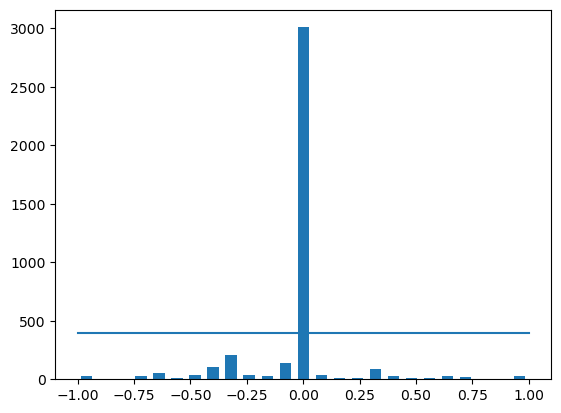

In [12]:
num_bins = 25

samples_per_bin = 400

hist, bins = np.histogram(data['steering'], num_bins)
center = (bins[:-1]+ bins[1:]) * 0.5
plt.bar(center, hist, width=0.05)
plt.plot((np.min(data['steering']), np.max(data['steering'])), (samples_per_bin, samples_per_bin))

Aquí podemos observar que los datos tienen más puntos de datos en el número de ángulos 0. Tomaremos hasta 400 puntos de datos y los representaremos gráficamente.

total data: 3973
removed: 2610
remaining: 1363


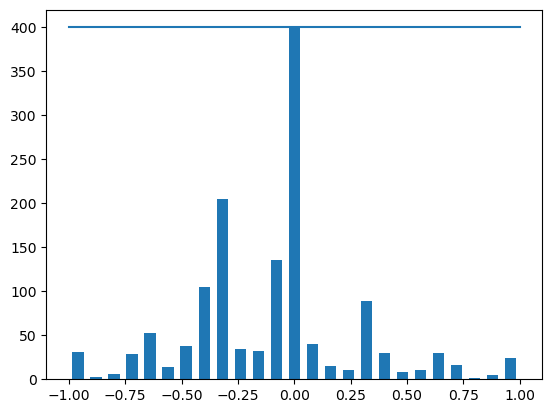

In [13]:
print('total data:', len(data))
remove_list = []
for j in range(num_bins):
    list_ = []
    for i in range(len(data['steering'])):
        if data['steering'][i] >= bins[j] and data['steering'][i] <= bins[j+1]:
            list_.append(i)
    list_ = shuffle(list_)
    list_ = list_[samples_per_bin:]
    remove_list.extend(list_)

print('removed:', len(remove_list))
data.drop(data.index[remove_list], inplace=True)
print('remaining:', len(data))

hist, _ = np.histogram(data['steering'], (num_bins))
plt.bar(center, hist, width=0.05)
plt.plot((np.min(data['steering']), np.max(data['steering'])), (samples_per_bin, samples_per_bin))

Aquí está el recuento de los datos después de tomar 400 muestras:

- Total de datos: 4053

- Eliminados: 2590

- Restantes: 1463

Ahora revisaremos los puntos como se muestra a continuación.

In [14]:
print(data.iloc[1])
def load_img_steering(datadir, df):
    image_path = []
    steering = []
    for i in range(len(data)):
        indexed_data = data.iloc[i]
        center, left, right = indexed_data[0], indexed_data[1], indexed_data[2]
        image_path.append(os.path.join(datadir, center.strip()))
        steering.append(float(indexed_data[3]))
        # left image append
        image_path.append(os.path.join(datadir,left.strip()))
        steering.append(float(indexed_data[3])+0.15)
        # right image append
        image_path.append(os.path.join(datadir,right.strip()))
        steering.append(float(indexed_data[3])-0.15)
    image_paths = np.asarray(image_path)
    steerings = np.asarray(steering)
    return image_paths, steerings

image_paths, steerings = load_img_steering(datadir + '/IMG', data)

center      center_2023_05_25_19_00_22_858.jpg
left          left_2023_05_25_19_00_22_858.jpg
right        right_2023_05_25_19_00_22_858.jpg
steering                                   0.0
throttle                                   0.0
reverse                                    0.0
speed                                 0.000077
Name: 5, dtype: object


Ahora procederemos a realizar la partición de los datos en conjuntos de entrenamiento y validación. También verificaremos que las gráficas de ambos conjuntos tengan una distribución similar a la del conjunto de datos original.

In [15]:
X_train, X_valid, y_train, y_valid = train_test_split(image_paths, steerings, test_size=0.2, random_state=6)
print('Training Samples: {}\nValid Samples: {}'.format(len(X_train), len(X_valid)))

Training Samples: 3271
Valid Samples: 818


In [ ]:
fig, axes = plt.subplots(1, 2, figsize=(12, 4))
axes[0].hist(y_train, bins=num_bins, width=0.05, color='blue')
axes[0].set_title('Training set')
axes[1].hist(y_valid, bins=num_bins, width=0.05, color='red')
axes[1].set_title('Validation set')

Ahora exploraremos la imagen y la limpiaremos. Solo recortaremos la parte útil de la imagen. Luego, aplicaremos varias técnicas de filtrado de visión por computadora a la imagen. Comenzaremos ampliando la imagen.

Text(0.5, 1.0, 'Zoomed Image')

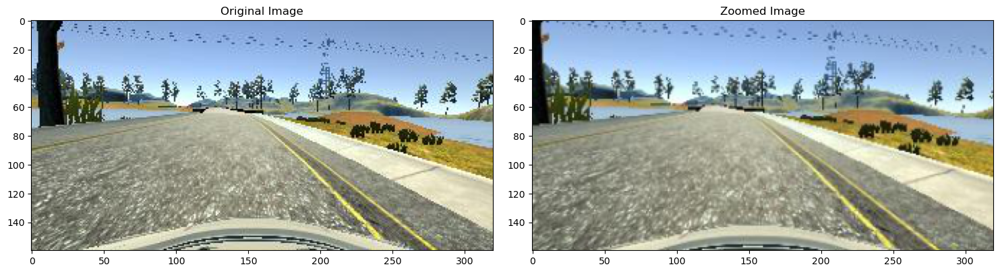

In [17]:
def zoom(image):
    zoom = iaa.Affine(scale=(1, 1.3))
    image = zoom.augment_image(image)
    return image


image = image_paths[random.randint(0, 1000)]
original_image = mpimg.imread(image)
zoomed_image = zoom(original_image)

fig, axs = plt.subplots(1, 2, figsize=(15, 10))
fig.tight_layout()

axs[0].imshow(original_image)
axs[0].set_title('Original Image')

axs[1].imshow(zoomed_image)
axs[1].set_title('Zoomed Image')


Usando la siguiente función, moveremos la imagen (panning)

Text(0.5, 1.0, 'Panned Image')

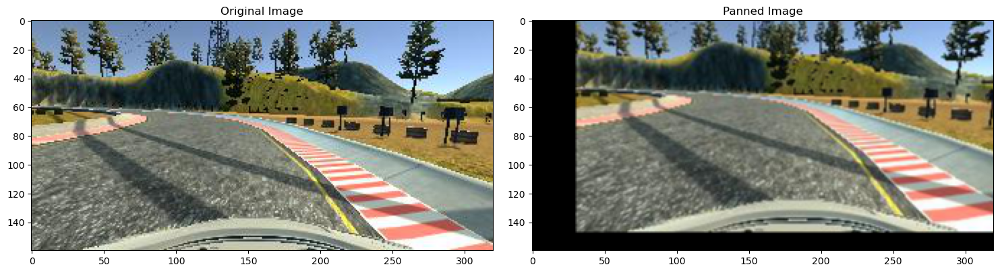

In [18]:
def pan(image):
    pan = iaa.Affine(translate_percent= {"x" : (-0.1, 0.1), "y": (-0.1, 0.1)})
    image = pan.augment_image(image)
    return image


image = image_paths[random.randint(0, 1000)]
original_image = mpimg.imread(image)
panned_image = pan(original_image)

fig, axs = plt.subplots(1, 2, figsize=(15, 10))
fig.tight_layout()

axs[0].imshow(original_image)
axs[0].set_title('Original Image')

axs[1].imshow(panned_image)
axs[1].set_title('Panned Image')

Ahora jugaremos con el brillo de la imagen.

Text(0.5, 1.0, 'Brightness altered image ')

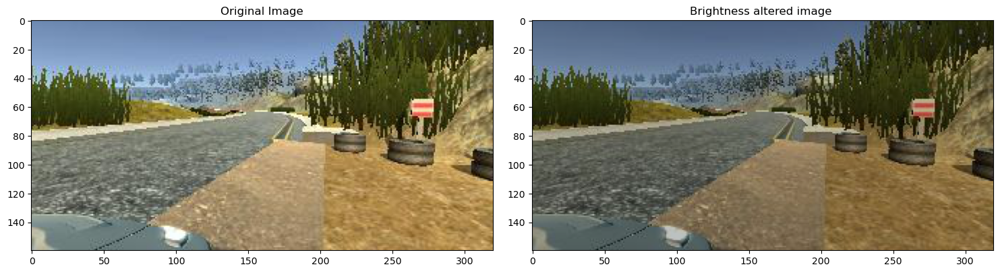

In [19]:
def img_random_brightness(image):
    brightness = iaa.Multiply((0.2, 1.2))
    image = brightness.augment_image(image)
    return image

image = image_paths[random.randint(0, 1000)]
original_image = mpimg.imread(image)
brightness_altered_image = img_random_brightness(original_image)

fig, axs = plt.subplots(1, 2, figsize=(15, 10))
fig.tight_layout()

axs[0].imshow(original_image)
axs[0].set_title('Original Image')

axs[1].imshow(brightness_altered_image)
axs[1].set_title('Brightness altered image ')

Ahora se haremos un cambio horizontal y vertical a la imagen.

Text(0.5, 1.0, 'Flipped Image - Steering Angle:0.19513650000000002')

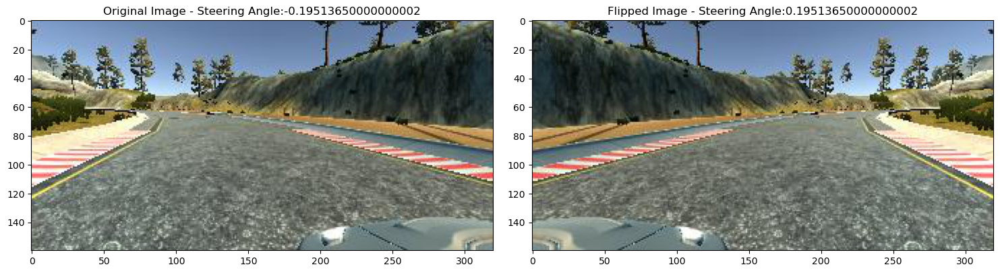

In [20]:
def img_random_flip(image, steering_angle):
    image = cv2.flip(image,1)
    steering_angle = -steering_angle
    return image, steering_angle


random_index = random.randint(0, 1000)
image = image_paths[random_index]
steering_angle = steerings[random_index]


original_image = mpimg.imread(image)
flipped_image, flipped_steering_angle = img_random_flip(original_image, steering_angle)

fig, axs = plt.subplots(1, 2, figsize=(15, 10))
fig.tight_layout()

axs[0].imshow(original_image)
axs[0].set_title('Original Image - ' + 'Steering Angle:' + str(steering_angle))

axs[1].imshow(flipped_image)
axs[1].set_title('Flipped Image - ' + 'Steering Angle:' + str(flipped_steering_angle))

Ahora rotaremos la imagen en base a la direccion del angulo del volante.

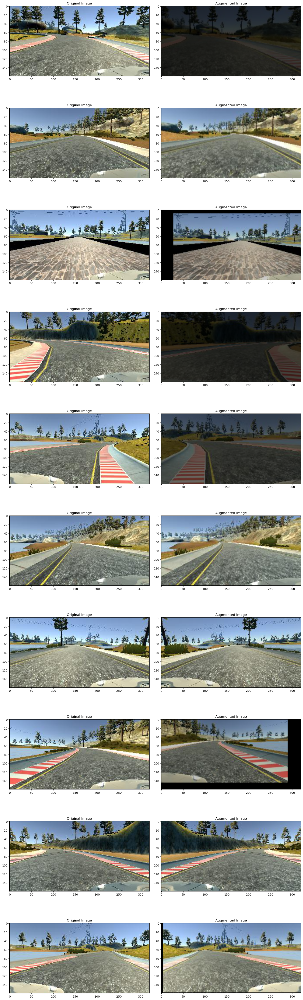

In [21]:
def random_augment(image, steering_angle):
    image = mpimg.imread(image)
    if np.random.rand() < 0.5:
        image = pan(image)
    if np.random.rand() < 0.5:
        image = zoom(image)
    if np.random.rand() < 0.5:
        image = img_random_brightness(image)
    if np.random.rand() < 0.5:
        image, steering_angle = img_random_flip(image, steering_angle)

    return image, steering_angle


ncol = 2
nrow = 10

fig, axs = plt.subplots(nrow, ncol, figsize=(15, 50))

fig.tight_layout()
for i in range(10):
    randnum = random.randint(0, len(image_paths) - 1)
    random_image = image_paths[randnum]
    random_steering = steerings[randnum]

    original_image = mpimg.imread(random_image)
    augmented_image, steering = random_augment(random_image, random_steering)

    axs[i][0].imshow(original_image)
    axs[i][0].set_title("Original Image")

    axs[i][1].imshow(augmented_image)
    axs[i][1].set_title("Augmented Image")

Ahora realizaremos un preprocesamiento de la imagen donde aplicaremos un filtro gaussiano y ajustaremos el tamaño de las imágenes para que se adapten mejor al modelo

Text(0.5, 1.0, 'Preprocessed Image')

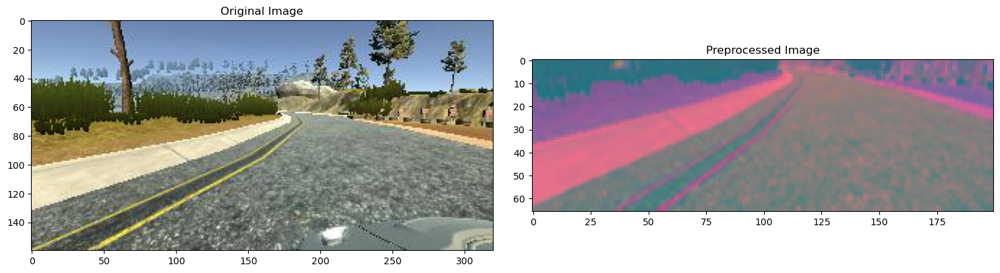

In [22]:
def img_preprocess(img):
    img = img[60:135,:,:]
    img = cv2.cvtColor(img, cv2.COLOR_RGB2YUV)
    img = cv2.GaussianBlur(img, (3, 3), 0)
    img = cv2.resize(img, (200, 66))
    img = img/255
    return img

image = image_paths[100]
original_image = mpimg.imread(image)
preprocessed_image = img_preprocess(original_image)

fig, axs = plt.subplots(1, 2, figsize=(15, 10))
fig.tight_layout()
axs[0].imshow(original_image)
axs[0].set_title('Original Image')
axs[1].imshow(preprocessed_image)
axs[1].set_title('Preprocessed Image')

Vamos a escribir un método llamado "batch_generator" que utiliza una instancia de la clase Sequence del objeto (keras.utils.Sequence) en nuestro dataset para evitar la duplicación de datos al utilizar multiprocessing. Este método proporciona objetos de tipo tupla; ya sea (input, target) o (input, target, sample_weight).

In [29]:
def batch_generator(image_paths, steering_ang, batch_size, istraining):

    while True:
        batch_img = []
        batch_steering = []

        for i in range(batch_size):
            
            random_index = random.randint(0, len(image_paths) - 1)
           
            if istraining:
                im, steering = random_augment(image_paths[random_index], steering_ang[random_index])
            else:
                im = mpimg.imread(image_paths[random_index])
                steering = steering_ang[random_index]
            
            im = img_preprocess(im)
            batch_img.append(im)
            batch_steering.append(steering)
        yield (np.asarray(batch_img), np.asarray(batch_steering))

Vamos a explorar el dataset creado a partir de estos batches.

Text(0.5, 1.0, 'Validation Image')

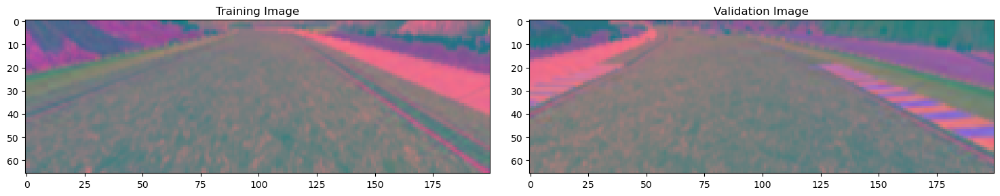

In [30]:
x_train_gen, y_train_gen = next(batch_generator(X_train, y_train, 1, 1))
x_valid_gen, y_valid_gen = next(batch_generator(X_valid, y_valid, 1, 0))

fig, axs = plt.subplots(1, 2, figsize=(15, 10))
fig.tight_layout()

axs[0].imshow(x_train_gen[0])
axs[0].set_title('Training Image')

axs[1].imshow(x_valid_gen[0])
axs[1].set_title('Validation Image')

El código para desarrollar la arquitectura NVIDIA para el clonado del comportamiento se puede ver en el siguiente bloque de código. Aquí utilizaremos ADAM como optimizador, MSE como función de pérdida ya que la salida es el ángulo de dirección y es un problema de regresión. Además, utilizaremos la función de activación Exponential Linear Unit (ELU). ELU es mejor que ReLU ya que reduce la función de costo más rápidamente a cero. ELU es más precisa y buena para resolver el problema del desvanecimiento del gradiente. Puedes leer más sobre ELU en el siguiente enlace: https://arxiv.org/abs/1511.07289.

La arquitectura NVIDIA utilizada para el clonado de comportamiento se basa en una red neuronal convolucional (CNN) profunda. A continuación, te proporciono más detalles sobre esta arquitectura:

1. Capas de convolución: La arquitectura comienza con capas de convolución para extraer características relevantes de las imágenes de entrada. Se utilizan varias capas de convolución con diferentes tamaños de filtro y número de filtros para capturar diferentes niveles de detalles y patrones en las imágenes.

2. Función de activación ELU: Se utiliza la función de activación Exponential Linear Unit (ELU) en todas las capas convolucionales y en algunas capas densas. ELU es una función que ayuda a mitigar el problema del desvanecimiento del gradiente y permite que la red converja más rápido.

3. Capas densas: Después de las capas convolucionales, las características extraídas se aplanan y se pasan a través de capas densas (totalmente conectadas). Estas capas permiten aprender representaciones más abstractas y realizar la tarea de regresión para predecir el ángulo de dirección.

4. Capa de salida: La capa de salida consta de una única neurona que predice el ángulo de dirección. Dado que es un problema de regresión, la función de activación lineal se utiliza en la capa de salida para obtener una predicción continua en lugar de una clasificación discreta.

5. Optimizador y función de pérdida: Se utiliza el optimizador ADAM, que es un algoritmo de optimización popular para entrenar redes neuronales. La función de pérdida utilizada es el Error Cuadrático Medio (MSE), ya que estamos tratando de minimizar la diferencia entre las predicciones del modelo y los valores reales de los ángulos de dirección.

In [51]:
def nvidia_model():
    model = tf.keras.Sequential()
    model.add(tf.keras.layers.Convolution2D(24, (5, 5), strides=(2, 2), input_shape=(66, 200, 3), activation='elu'))
    model.add(tf.keras.layers.Convolution2D(36, (5, 5), strides=(2, 2), activation='elu'))
    model.add(tf.keras.layers.Convolution2D(48, (5, 5), strides=(2, 2), activation='elu'))
    model.add(tf.keras.layers.Convolution2D(64, (3, 3), activation='elu'))

    model.add(tf.keras.layers.Convolution2D(64, 3, 3, activation='elu'))
    # model.add(tf.keras.layers.Dropout(0.5))


    model.add(tf.keras.layers.Flatten())

    model.add(tf.keras.layers.Dense(100, activation = 'elu'))
    
    model.add(tf.keras.layers.Dense(50, activation = 'elu'))
    

    model.add(tf.keras.layers.Dense(10, activation = 'elu'))
    

    model.add(tf.keras.layers.Dense(1))

    optimizer = Adam(learning_rate=1e-3)
    model.compile(loss='mse', optimizer=optimizer)
    return model

Imprimimos un resumen del modelo.

In [52]:
from tensorflow import keras
from tensorflow.keras.layers import Conv2D, Dense, Dropout

model = nvidia_model()
print(model.summary())

Model: "sequential_9"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_5 (Conv2D)           (None, 31, 98, 24)        1824      
                                                                 
 conv2d_6 (Conv2D)           (None, 14, 47, 36)        21636     
                                                                 
 conv2d_7 (Conv2D)           (None, 5, 22, 48)         43248     
                                                                 
 conv2d_8 (Conv2D)           (None, 3, 20, 64)         27712     
                                                                 
 conv2d_9 (Conv2D)           (None, 1, 6, 64)          36928     
                                                                 
 flatten_1 (Flatten)         (None, 384)               0         
                                                                 
 dense_4 (Dense)             (None, 100)              

Ahora entrenaremos el modelo.

In [53]:
history = model.fit_generator(batch_generator(X_train, y_train, 100, 1),
                              steps_per_epoch=300,
                              epochs=10,
                              validation_data=batch_generator(X_valid, y_valid, 100, 0),
                              validation_steps=200,
                              verbose=1,
                              shuffle = 1)

C:\Users\rescudero\AppData\Local\Temp\ipykernel_25984\1702182736.py:1: UserWarning: `Model.fit_generator` is deprecated and will be removed in a future version. Please use `Model.fit`, which supports generators.
  history = model.fit_generator(batch_generator(X_train, y_train, 100, 1),


Epoch 1/10
300/300 [==============================] - 344s 1s/step - loss: 0.1458 - val_loss: 0.1084
Epoch 2/10
300/300 [==============================] - 385s 1s/step - loss: 0.1172 - val_loss: 0.0978
Epoch 3/10
300/300 [==============================] - 394s 1s/step - loss: 0.1045 - val_loss: 0.0901
Epoch 4/10
300/300 [==============================] - 372s 1s/step - loss: 0.0982 - val_loss: 0.0936
Epoch 5/10
300/300 [==============================] - 361s 1s/step - loss: 0.0934 - val_loss: 0.0937
Epoch 6/10
300/300 [==============================] - 317s 1s/step - loss: 0.0886 - val_loss: 0.0871
Epoch 7/10
300/300 [==============================] - 227s 758ms/step - loss: 0.0856 - val_loss: 0.0803
Epoch 8/10
300/300 [==============================] - 222s 743ms/step - loss: 0.0832 - val_loss: 0.0866
Epoch 9/10
300/300 [==============================] - 213s 712ms/step - loss: 0.0804 - val_loss: 0.0786
Epoch 10/10
300/300 [==============================] - 213s 710ms/step - loss: 0.0

Ahora, revisaremos la pérdida de entrenamiento y validación del modelo

Text(0.5, 0, 'Epoch')

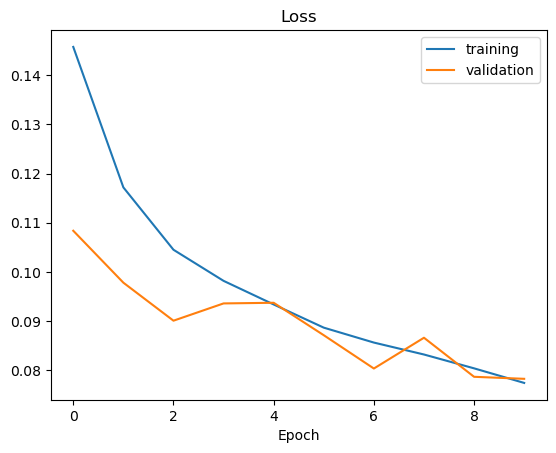

In [54]:
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.legend(['training', 'validation'])
plt.title('Loss')
plt.xlabel('Epoch')

Por último, guardaremos el modelo ya que lo utilizaremos más adelante para la conducción autónoma.

In [55]:
model.save('model.h5')

# Evaluar Modelo

El último paso es verificar cómo está funcionando nuestro modelo. Para validar el simulador, debemos ejecutar el modelo en el modo autónomo. Para hacer esto, debemos escribir un script que establezca la comunicación bidireccional entre el cliente y el servidor, y conecte el modelo al simulador. Un ejemplo de esto se puede ver en el siguiente diagrama.


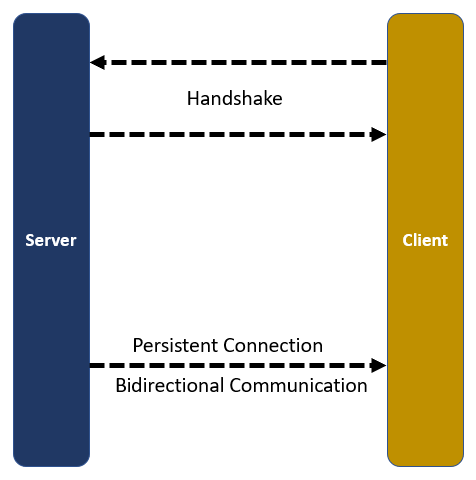

Primero, importaremos las bibliotecas necesarias, incluyendo socketio, eventlet, numpy y OpenCV.

In [56]:
import socketio
import eventlet
import numpy as np
from flask import Flask
from keras.models import load_model
import base64
from io import BytesIO
from PIL import Image
import cv2

Ahora nos conectaremos al socket

In [64]:
sio = socketio.Server()
 
app = Flask(__name__) #'__main__'
speed_limit = 35
def img_preprocess(img):
    img = img[60:135,:,:]
    img = cv2.cvtColor(img, cv2.COLOR_RGB2YUV)
    img = cv2.GaussianBlur(img, (3, 3), 0)
    img = cv2.resize(img, (200, 66))
    img = img/255
    return img

Luego, definiremos el controlador de eventos para poder cargar el modelo.

In [65]:
@sio.on('telemetry')
def telemetry(sid, data):
    speed = float(data['speed'])
    image = Image.open(BytesIO(base64.b64decode(data['image'])))
    image = np.asarray(image)
    image = img_preprocess(image)
    image = np.array([image])
    steering_angle = float(model.predict(image))
    throttle = 1.0 - speed/speed_limit
    print('{} {} {}'.format(steering_angle, throttle, speed))
    send_control(steering_angle, throttle)

Después de eso, necesitamos escribir una función que controle el ángulo de dirección y la velocidad del automóvil.

In [66]:
@sio.on('connect')
def connect(sid, environ):
    print('Connected')
    send_control(0, 0)
 
def send_control(steering_angle, throttle):
    sio.emit('steer', data = {
        'steering_angle': steering_angle.__str__(),
        'throttle': throttle.__str__()
    })

A continuación, cargaremos el modelo y estableceremos la conexión cliente-servidor.

In [67]:
if __name__ == '__main__':
    model = load_model('model.h5')
    app = socketio.Middleware(sio, app)
    eventlet.wsgi.server(eventlet.listen(('', 4567)), app)

(25984) wsgi starting up on http://0.0.0.0:4567
(25984) accepted ('127.0.0.1', 55254)
127.0.0.1 - - [25/May/2023 21:10:07] "GET /socket.io/?EIO=4&transport=websocket HTTP/1.1" 200 0 23.958430
(25984) accepted ('127.0.0.1', 55268)
127.0.0.1 - - [25/May/2023 21:11:18] "GET /socket.io/?EIO=4&transport=websocket HTTP/1.1" 200 0 55.941514
wsgi exiting
(25984) wsgi exited, is_accepting=True
